# Airbnb 

## Section 1 - Data Manipulation

In [119]:
# Importing necessary libraries
import pandas as pd                      # Library for working with data
import numpy as np                       # Library for high level working with linear algebra
import scipy as sp                       # Library containing statistical tools
import matplotlib.pyplot as plt          # Library for plotting graphs
import seaborn as sns                    # Library for plotting graphs with great appearance
import matplotlib.colors as mcolors      # Library containing a great variety of colors
import folium                            #Library for constructing iterative maps
%matplotlib inline

In [120]:
# Accessing the data
df = pd.read_csv('https://github.com/marcellongvb/analysis_airbnb/raw/main/airbnb.csv')

In [121]:
# DataFrame first look
df.head()

,host_is_superhost,cancellation_policy,instant_bookable,host_total_listings_count,neighbourhood_cleansed,latitude,longitude,property_type,room_type,accommodates,...,bedrooms_na,bathrooms_na,beds_na,review_scores_rating_na,review_scores_accuracy_na,review_scores_cleanliness_na,review_scores_checkin_na,review_scores_communication_na,review_scores_location_na,review_scores_value_na
0,t,moderate,t,1.0,Western Addition,37.76931,-122.43386,Apartment,Entire home/apt,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,f,strict_14_with_grace_period,f,2.0,Bernal Heights,37.74511,-122.42102,Apartment,Entire home/apt,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,f,strict_14_with_grace_period,f,10.0,Haight Ashbury,37.76669,-122.45250,Apartment,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,f,strict_14_with_grace_period,f,10.0,Haight Ashbury,37.76487,-122.45183,Apartment,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,f,strict_14_with_grace_period,f,2.0,Western Addition,37.77525,-122.43637,House,Entire home/apt,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [122]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7146 entries, 0 to 7145
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   host_is_superhost               7146 non-null   object 
 1   cancellation_policy             7146 non-null   object 
 2   instant_bookable                7146 non-null   object 
 3   host_total_listings_count       7146 non-null   float64
 4   neighbourhood_cleansed          7146 non-null   object 
 5   latitude                        7146 non-null   float64
 6   longitude                       7146 non-null   float64
 7   property_type                   7146 non-null   object 
 8   room_type                       7146 non-null   object 
 9   accommodates                    7146 non-null   float64
 10  bathrooms                       7146 non-null   float64
 11  bedrooms                        7146 non-null   float64
 12  beds                            71

The data has 34 columns and 7146 entries. With many floats and some object data types. Next steps for data manipultion:
1. Verifying empty entries in each column;
2. Renaming columns;
3. Verifying the datatypes of each column and change to other adequate datatype when necessary;
4. Remove, modify or create data from the original, when necessary;

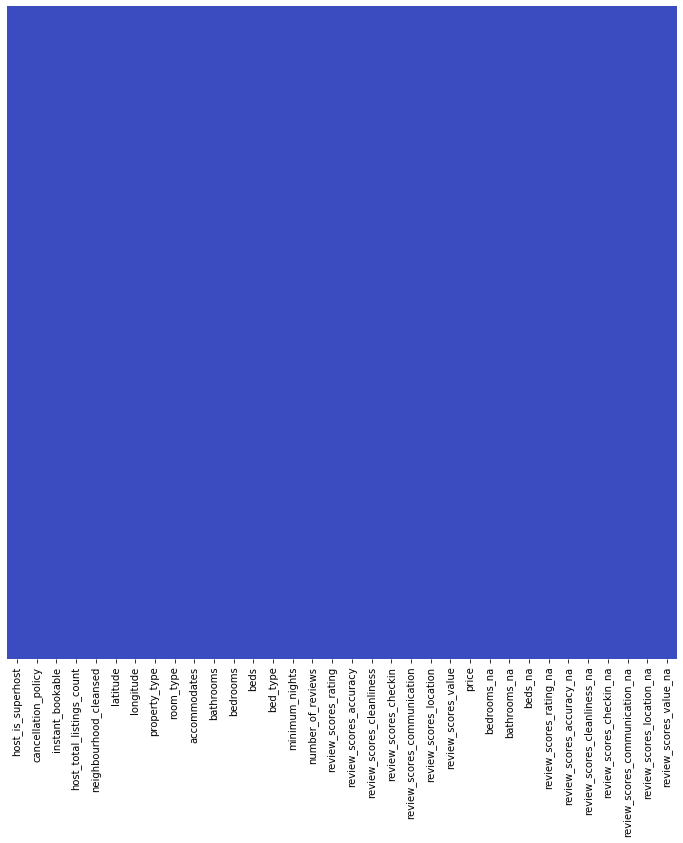

In [123]:
# Verifying empty entries in the data
plt.figure(figsize=(12,12))
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='coolwarm')

That is great. There is no empty values in the data, this is a good sign that not many treatment is needed.

In [124]:
# Listing columns names
df.columns

Index(['host_is_superhost', 'cancellation_policy', 'instant_bookable',
       'host_total_listings_count', 'neighbourhood_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bedrooms', 'beds', 'bed_type', 'minimum_nights', 'number_of_reviews',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'price', 'bedrooms_na', 'bathrooms_na',
       'beds_na', 'review_scores_rating_na', 'review_scores_accuracy_na',
       'review_scores_cleanliness_na', 'review_scores_checkin_na',
       'review_scores_communication_na', 'review_scores_location_na',
       'review_scores_value_na'],
      dtype='object')

In [125]:
# Constructing dictionary for modifying columns' names
newcols = {}
for column_name in df.columns:
    newcols[column_name] = column_name.capitalize().replace('_', ' ')
newcols
# Renaming columns
df.rename(columns=newcols, inplace = True)

In [126]:
df.head()

,Host is superhost,Cancellation policy,Instant bookable,Host total listings count,Neighbourhood cleansed,Latitude,Longitude,Property type,Room type,Accommodates,...,Bedrooms na,Bathrooms na,Beds na,Review scores rating na,Review scores accuracy na,Review scores cleanliness na,Review scores checkin na,Review scores communication na,Review scores location na,Review scores value na
0,t,moderate,t,1.0,Western Addition,37.76931,-122.43386,Apartment,Entire home/apt,3.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,f,strict_14_with_grace_period,f,2.0,Bernal Heights,37.74511,-122.42102,Apartment,Entire home/apt,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,f,strict_14_with_grace_period,f,10.0,Haight Ashbury,37.76669,-122.45250,Apartment,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,f,strict_14_with_grace_period,f,10.0,Haight Ashbury,37.76487,-122.45183,Apartment,Private room,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,f,strict_14_with_grace_period,f,2.0,Western Addition,37.77525,-122.43637,House,Entire home/apt,5.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Reorganizing the dataframe so that the binary categorical columns are positioned to the left of the dataframe.

In [127]:
# Getting binary and non-binary columns
binary_columns = []
non_binary_columns= []
for column in df.columns:
    if len(df[column].value_counts()) == 2:
        binary_columns.append(column)
    else:
        non_binary_columns.append(column) 

binary_columns

['Host is superhost',
 'Instant bookable',
 'Bedrooms na',
 'Bathrooms na',
 'Beds na',
 'Review scores rating na',
 'Review scores accuracy na',
 'Review scores cleanliness na',
 'Review scores checkin na',
 'Review scores communication na',
 'Review scores location na',
 'Review scores value na']

Most of the binary columns ends with ```na```. I will try to understand the meaning of it soon.

In [128]:
# Reordering columns
new_order = binary_columns + non_binary_columns
df = df[new_order]
df.head()

,Host is superhost,Instant bookable,Bedrooms na,Bathrooms na,Beds na,Review scores rating na,Review scores accuracy na,Review scores cleanliness na,Review scores checkin na,Review scores communication na,...,Minimum nights,Number of reviews,Review scores rating,Review scores accuracy,Review scores cleanliness,Review scores checkin,Review scores communication,Review scores location,Review scores value,Price
0,t,t,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,180.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,170.0
1,f,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,30.0,111.0,98.0,10.0,10.0,10.0,10.0,10.0,9.0,235.0
2,f,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,32.0,17.0,85.0,8.0,8.0,9.0,9.0,9.0,8.0,65.0
3,f,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,32.0,8.0,93.0,9.0,9.0,10.0,10.0,9.0,9.0,65.0
4,f,f,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,27.0,97.0,10.0,10.0,10.0,10.0,10.0,9.0,785.0


In [129]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7146 entries, 0 to 7145
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Host is superhost               7146 non-null   object 
 1   Instant bookable                7146 non-null   object 
 2   Bedrooms na                     7146 non-null   float64
 3   Bathrooms na                    7146 non-null   float64
 4   Beds na                         7146 non-null   float64
 5   Review scores rating na         7146 non-null   float64
 6   Review scores accuracy na       7146 non-null   float64
 7   Review scores cleanliness na    7146 non-null   float64
 8   Review scores checkin na        7146 non-null   float64
 9   Review scores communication na  7146 non-null   float64
 10  Review scores location na       7146 non-null   float64
 11  Review scores value na          7146 non-null   float64
 12  Cancellation policy             71

Now I focus in the datatypes. Some columns are unnecessarily of the type ```object``` or ```float```. I will try to change it to ```string``` or ```integer``` whenever possible. As I check columns one by one, I may also rename the column to a better name.

Modification: Host is superhost, Instant bookable: Change ```t``` $\rightarrow$ ```1``` (true), ```f``` $\rightarrow$ ```0``` (false).

In [130]:
df.rename(columns={'Host is superhost' : 'Superhost'}, inplace = True)
df['Superhost'] = df['Superhost'].apply(lambda x: 1 if x=='t' else (0 if x=='f' else None))
df['Instant bookable'] = df['Instant bookable'].apply(lambda x: 1 if x=='t' else (0 if x=='f' else None))

In [131]:
df.head()

,Superhost,Instant bookable,Bedrooms na,Bathrooms na,Beds na,Review scores rating na,Review scores accuracy na,Review scores cleanliness na,Review scores checkin na,Review scores communication na,...,Minimum nights,Number of reviews,Review scores rating,Review scores accuracy,Review scores cleanliness,Review scores checkin,Review scores communication,Review scores location,Review scores value,Price
0,1,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,180.0,97.0,10.0,10.0,10.0,10.0,10.0,10.0,170.0
1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,30.0,111.0,98.0,10.0,10.0,10.0,10.0,10.0,9.0,235.0
2,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,32.0,17.0,85.0,8.0,8.0,9.0,9.0,9.0,8.0,65.0
3,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,32.0,8.0,93.0,9.0,9.0,10.0,10.0,9.0,9.0,65.0
4,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7.0,27.0,97.0,10.0,10.0,10.0,10.0,10.0,9.0,785.0


The next binary columns, ending with ```na```, seems to point entries where there should have a ```NaN```, <i>i.e.</i>, entries that should not be filled. Example: Bathrooms 

In [132]:
# Counting different entries in column Bathrooms where 'Bathroons na' == 0 (false)
df[df['Bathrooms na'] == 0]['Bathrooms'].value_counts()

1.0     5124
2.0     1005
1.5      480
2.5      173
3.0      132
3.5       54
0.0       39
4.0       32
5.0       26
0.5       17
8.0       15
10.0      12
4.5        8
6.0        6
5.5        1
14.0       1
Name: Bathrooms, dtype: int64

In [133]:
# Counting different entries in column Bathrooms where 'Bathroons na' == 1 (true)
df[df['Bathrooms na'] == 1]['Bathrooms'].value_counts()

1.0    21
Name: Bathrooms, dtype: int64

I will verify if this happens with two other columns and, if yes, I will assume this happens for all columns with ```na``` and treat adequately.

In [134]:
df[df['Bedrooms na']==0]['Bedrooms'].value_counts()

1.0     4197
2.0     1304
0.0      804
3.0      627
4.0      175
5.0       25
6.0        9
7.0        2
14.0       1
Name: Bedrooms, dtype: int64

In [135]:
df[df['Bedrooms na']==1]['Bedrooms'].value_counts()

1.0    2
Name: Bedrooms, dtype: int64

In [136]:
df[df['Review scores rating na']==0]['Review scores rating'].value_counts()

100.0    1603
98.0      677
99.0      617
97.0      596
96.0      418
95.0      348
93.0      249
94.0      234
90.0      167
92.0      141
80.0      125
91.0      108
89.0       71
87.0       66
88.0       58
60.0       44
86.0       41
85.0       27
70.0       21
84.0       20
83.0       16
82.0       14
76.0        8
20.0        8
40.0        6
75.0        6
77.0        6
78.0        5
73.0        5
81.0        5
67.0        4
74.0        2
79.0        2
50.0        2
30.0        1
72.0        1
63.0        1
56.0        1
64.0        1
Name: Review scores rating, dtype: int64

In [137]:
df[df['Review scores rating na']==1]['Review scores rating'].value_counts()

98.0    1421
Name: Review scores rating, dtype: int64

Let's verify the mean and the median of each of these columns:

In [138]:
df[['Bathrooms', 'Bedrooms', 'Review scores rating']].mean()

Bathrooms                1.328086
Bedrooms                 1.342709
Review scores rating    96.034285
dtype: float64

In [139]:
df[['Bathrooms', 'Bedrooms', 'Review scores rating']].median()

Bathrooms                1.0
Bedrooms                 1.0
Review scores rating    98.0
dtype: float64

So it seems that the columns with empty values were filled with the value of the median of the corresponding column. I will keep these values and the columns that gives information about the artificially filled entries.

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7146 entries, 0 to 7145
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Superhost                       7146 non-null   int64  
 1   Instant bookable                7146 non-null   int64  
 2   Bedrooms na                     7146 non-null   float64
 3   Bathrooms na                    7146 non-null   float64
 4   Beds na                         7146 non-null   float64
 5   Review scores rating na         7146 non-null   float64
 6   Review scores accuracy na       7146 non-null   float64
 7   Review scores cleanliness na    7146 non-null   float64
 8   Review scores checkin na        7146 non-null   float64
 9   Review scores communication na  7146 non-null   float64
 10  Review scores location na       7146 non-null   float64
 11  Review scores value na          7146 non-null   float64
 12  Cancellation policy             71

Now, let's inspect the data in every column to understand their nature

In [141]:
df.columns

Index(['Superhost', 'Instant bookable', 'Bedrooms na', 'Bathrooms na',
       'Beds na', 'Review scores rating na', 'Review scores accuracy na',
       'Review scores cleanliness na', 'Review scores checkin na',
       'Review scores communication na', 'Review scores location na',
       'Review scores value na', 'Cancellation policy',
       'Host total listings count', 'Neighbourhood cleansed', 'Latitude',
       'Longitude', 'Property type', 'Room type', 'Accommodates', 'Bathrooms',
       'Bedrooms', 'Beds', 'Bed type', 'Minimum nights', 'Number of reviews',
       'Review scores rating', 'Review scores accuracy',
       'Review scores cleanliness', 'Review scores checkin',
       'Review scores communication', 'Review scores location',
       'Review scores value', 'Price'],
      dtype='object')

In [142]:
# Printing unique values in every column of df
for column in df.columns:
    print(column+': '.upper(), '\n', df[column].value_counts(), '\n', '\n')

Superhost:  
 0    4215
1    2931
Name: Superhost, dtype: int64 
 

Instant bookable:  
 0    4430
1    2716
Name: Instant bookable, dtype: int64 
 

Bedrooms na:  
 0.0    7144
1.0       2
Name: Bedrooms na, dtype: int64 
 

Bathrooms na:  
 0.0    7125
1.0      21
Name: Bathrooms na, dtype: int64 
 

Beds na:  
 0.0    7139
1.0       7
Name: Beds na, dtype: int64 
 

Review scores rating na:  
 0.0    5725
1.0    1421
Name: Review scores rating na, dtype: int64 
 

Review scores accuracy na:  
 0.0    5721
1.0    1425
Name: Review scores accuracy na, dtype: int64 
 

Review scores cleanliness na:  
 0.0    5722
1.0    1424
Name: Review scores cleanliness na, dtype: int64 
 

Review scores checkin na:  
 0.0    5719
1.0    1427
Name: Review scores checkin na, dtype: int64 
 

Review scores communication na:  
 0.0    5723
1.0    1423
Name: Review scores communication na, dtype: int64 
 

Review scores location na:  
 0.0    5719
1.0    1427
Name: Review scores location na, dtype: int6

As we can see above, the categorical variables are (without the columns ending with ```na```):
* ```Superhost```;
* ```Instant bookable```;
* ```Cancellation policy```;
* ```Neighbourhood cleansed```;
* ```Property type```;
* ```Room type```;
* ```Accomodates```;
* ```Bathrooms```;
* ```Bedrooms```;
* ```Beds```;
* ```Bed type```;
* ```Review scores accuracy```;
* ```Review scores cleanliness```;
* ```Review scores checkin```;
* ```Review scores communication```;
* ```Review scores location```;
* ```Review scores value```;

Last treatment: Converting some ```float64``` columns to ```int``` and some ```object``` columns to ```str```

In [143]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7146 entries, 0 to 7145
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Superhost                       7146 non-null   int64  
 1   Instant bookable                7146 non-null   int64  
 2   Bedrooms na                     7146 non-null   float64
 3   Bathrooms na                    7146 non-null   float64
 4   Beds na                         7146 non-null   float64
 5   Review scores rating na         7146 non-null   float64
 6   Review scores accuracy na       7146 non-null   float64
 7   Review scores cleanliness na    7146 non-null   float64
 8   Review scores checkin na        7146 non-null   float64
 9   Review scores communication na  7146 non-null   float64
 10  Review scores location na       7146 non-null   float64
 11  Review scores value na          7146 non-null   float64
 12  Cancellation policy             71

In [144]:
df.columns

Index(['Superhost', 'Instant bookable', 'Bedrooms na', 'Bathrooms na',
       'Beds na', 'Review scores rating na', 'Review scores accuracy na',
       'Review scores cleanliness na', 'Review scores checkin na',
       'Review scores communication na', 'Review scores location na',
       'Review scores value na', 'Cancellation policy',
       'Host total listings count', 'Neighbourhood cleansed', 'Latitude',
       'Longitude', 'Property type', 'Room type', 'Accommodates', 'Bathrooms',
       'Bedrooms', 'Beds', 'Bed type', 'Minimum nights', 'Number of reviews',
       'Review scores rating', 'Review scores accuracy',
       'Review scores cleanliness', 'Review scores checkin',
       'Review scores communication', 'Review scores location',
       'Review scores value', 'Price'],
      dtype='object')

In [145]:
int_cols = ['Bedrooms na',
            'Bathrooms na',  
            'Beds na',
            'Review scores rating na',
            'Review scores accuracy na',
            'Review scores cleanliness na',
            'Review scores checkin na',
            'Review scores communication na',
            'Review scores location na',
            'Review scores value na',
            'Host total listings count',
            'Accommodates',
            'Bedrooms',
            'Beds',
            'Minimum nights',
            'Number of reviews',
            'Review scores rating',
            'Review scores accuracy',
            'Review scores cleanliness',
            'Review scores checkin',
            'Review scores communication',
            'Review scores location',
            'Review scores value'
           ]

In [146]:
for column in int_cols:
    df = df.astype({column: 'int64'}) # The capital Int64 is a format of integer numbers that accepts NaN 
#     entries
df.dtypes

Superhost                           int64
Instant bookable                    int64
Bedrooms na                         int64
Bathrooms na                        int64
Beds na                             int64
Review scores rating na             int64
Review scores accuracy na           int64
Review scores cleanliness na        int64
Review scores checkin na            int64
Review scores communication na      int64
Review scores location na           int64
Review scores value na              int64
Cancellation policy                object
Host total listings count           int64
Neighbourhood cleansed             object
Latitude                          float64
Longitude                         float64
Property type                      object
Room type                          object
Accommodates                        int64
Bathrooms                         float64
Bedrooms                            int64
Beds                                int64
Bed type                          

In [147]:
str_cols = ['Cancellation policy',
            'Neighbourhood cleansed',
            'Property type',
            'Room type',
            'Bed type']
for column in str_cols:
    df = df.astype({column: 'string'})
df.dtypes

Superhost                           int64
Instant bookable                    int64
Bedrooms na                         int64
Bathrooms na                        int64
Beds na                             int64
Review scores rating na             int64
Review scores accuracy na           int64
Review scores cleanliness na        int64
Review scores checkin na            int64
Review scores communication na      int64
Review scores location na           int64
Review scores value na              int64
Cancellation policy                string
Host total listings count           int64
Neighbourhood cleansed             string
Latitude                          float64
Longitude                         float64
Property type                      string
Room type                          string
Accommodates                        int64
Bathrooms                         float64
Bedrooms                            int64
Beds                                int64
Bed type                          

This data seems to have a high quality, not much of treatment was needed to work with it. Now that the dataframe is in an adequate form, let's describe the variables:
* ```Superhost```: Whether the host of the accomodation has the status of Superhost;
* ```Instant bookable```: Whether the accomodation is available for instantly booking;
* ```Cancellation policy```: Category of rules for cancellation;
* ```Host total listings count```: Number of accomodations registered by one single host;
* ```Neighbourhood cleansed```: Neighbourhood where the accomodation is located;
* ```Latitude```: Latitude coordinate;
* ```Longitude```: Longitude coordinate;
* ```Property type```: Type of the accomodation (Hotel, apartment, hostel, etc.);
* ```Room type```: Room category for staying in the accomodation (entire home, private room or shared room);
* ```Accommodates```: Maximum number of people allowed for one reservation;
* ```Bathrooms```: Number of bathrooms available in the accomodation (May be a non-integer number. If this happens, it seems that the non-integer number correspond to bathrooms having only the toilet.);
* ```Bedrooms```: Number of bedrooms available in the accomodation;
* ```Beds```: Total number of beds available in the accomodation;
* ```Bed type```: Bed category available in the accomodation ( Real Bed, futon, pull-out sofa, Airbed or couch.);
* ```Minimum nights```; Minimum nights allowed for making the reservation;
* ```Number of reviews```: Total number of reviews from previous clients;
* ```Review scores rating```: General rating of the accomodation;
* ```Review scores accuracy```   Rating of the accuracy of the description about the accomodation;
* ```Review scores cleanliness``` Rating of the cleanliness of the accomodation;
* ```Review scores checkin``` Rating of the check-in service; 
* ```Review scores communication``` Rating of the communication with the host;
* ```Review scores location``` Rating of the location of the accomodation;
* ```Review scores value``` Rating of the accomodation's price;
* ```Price```  Price of one night reservation in dollars ($);

## Exploratory data analysis

Before exploring the data and plotting some graphs, as the data already contains the geographical coordinates of the accommodations, let's visualize the accomodations distribution in a map. 
Before plotting the map, let's add a description of the accommodation to the data.

In [148]:
# Creating description of the accomodation
df['Description'] = df['Bedrooms'].astype(str) + ' Bedroom ' + df['Property type'].astype(str) + ' in ' + \
df['Neighbourhood cleansed'].astype(str) + ' for ' + df['Accommodates'].astype(str) + \
df['Accommodates'].apply(lambda x: ' people.' if x > 1 else ' person.')
df['Description']

0       1 Bedroom Apartment in Western Addition for 3 ...
1       2 Bedroom Apartment in Bernal Heights for 5 pe...
2       1 Bedroom Apartment in Haight Ashbury for 2 pe...
3       1 Bedroom Apartment in Haight Ashbury for 2 pe...
4       2 Bedroom House in Western Addition for 5 people.
                              ...                        
7141          1 Bedroom House in Noe Valley for 3 people.
7142    0 Bedroom Guest suite in Russian Hill for 2 pe...
7143    1 Bedroom Apartment in Western Addition for 4 ...
7144    1 Bedroom Apartment in Downtown/Civic Center f...
7145    2 Bedroom Apartment in Downtown/Civic Center f...
Name: Description, Length: 7146, dtype: object

In [149]:
# Creating column to classify accommodations by maximum number of guests as 1, 2, 3 and 4+
df['Max guests'] = df['Accommodates'].apply(lambda x: str(x) if x < 4 else '4+')
df['Max guests']

0        3
1       4+
2        2
3        2
4       4+
        ..
7141     3
7142     2
7143    4+
7144     3
7145    4+
Name: Max guests, Length: 7146, dtype: object

In [150]:
# Creating a dictionary for associating different colors to different number of maximum guests

max_guests_colors = {}
max_guests_colors['1'] = 'darkslategray'
max_guests_colors['2'] = 'teal'
max_guests_colors['3']= 'darkturquoise'
max_guests_colors['4+']= 'paleturquoise'

In [151]:
from  geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="http")
loc = geolocator.geocode('San Francisco, California, US')
loc

Location(San Francisco, San Francisco City and County, California, United States of America, (37.7790262, -122.4199061, 0.0))

In [152]:
print('Accommodations', '\n')

san_francisco_map = folium.Map(location=[loc.latitude, loc.longitude], zoom_start=12, tiles = 'Stamen Terrain')
san_francisco_map

# instantiate a feature group for the cities in the dataframe
accommodations_map = folium.map.FeatureGroup()

# loop through the cities and add each to the cities feature group
for lat, lng, description, max_guests in zip(df['Latitude'],
                                             df['Longitude'],
                                             df['Description'],
                                             df['Max guests']):
    accommodations_map.add_child(
    folium.vector_layers.CircleMarker(
            [lat, lng],
            radius=3, # define how big you want the circle markers to be
            color=max_guests_colors[max_guests],
            fill=True,
            fill_color='darkviolet',
            fill_opacity=0.8,
            popup = description
        )
    )
san_francisco_map.add_child(accommodations_map)

Accommodations 



Now, let's evaluate some graphs and descriptive statistics to understand the data. The above map indicates that the accommodations for 1 person and 3 people are less numbered than for accomodations for 2 people and for 4 or more people. Let's verify if this is correct. 

In [153]:
# Reordering number of max guests in ascending order
idx = df['Max guests'].value_counts().index
vals = df['Max guests'].value_counts().values
new_ord_idx = [2, 0, 3, 1]
ordered_idx = [idx[i] for i in new_ord_idx]
ordered_values = [vals[i] for i in new_ord_idx]

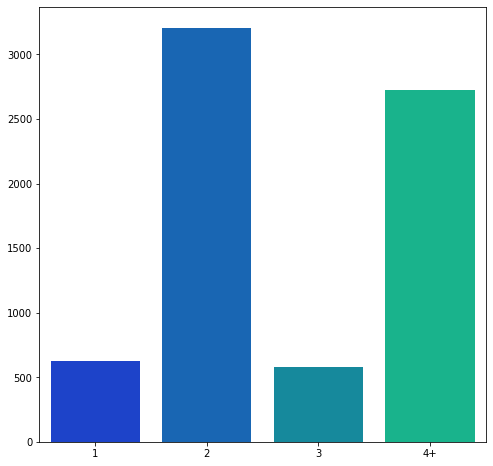

In [154]:
plt.figure(figsize=(8,8))
sns.barplot(ordered_idx, ordered_values, palette='winter')

In [155]:
print('Accomodations for at most 1 and 3 people correspond to approximately',
      round(((ordered_values[0] + ordered_values[2] )/ np.sum(ordered_values))*100), '% of the data.'
     )

Accomodations for at most 1 and 3 people correspond to approximately 17.0 % of the data.


Indeed, accommodations for 1 person and 3 people are less numbered than the others. This variable has unballanced data, as these two groups composes 17% of the total data. This fact must be carefuly treated if we use this variable later. Before investigating the other variables, let's visualize the original data, without grouping some data into one (4+).

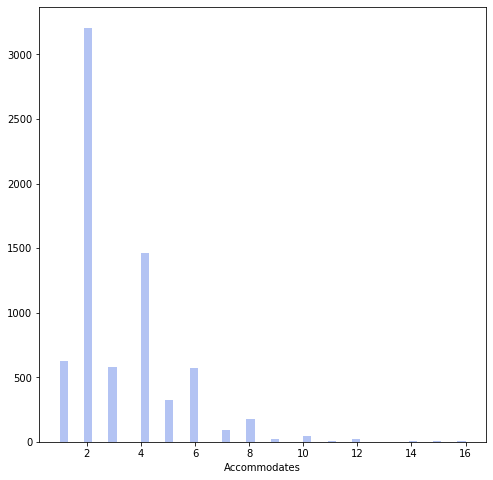

In [156]:
plt.figure(figsize=(8,8))
sns.distplot(df['Accommodates'], color='royalblue', kde=False)

Even before the aggregation, the number of accommodations that accept up to 4 people is the second greater group. Now, let's study other variables.

Text(0.5, 1.0, 'Superhosts distribution')

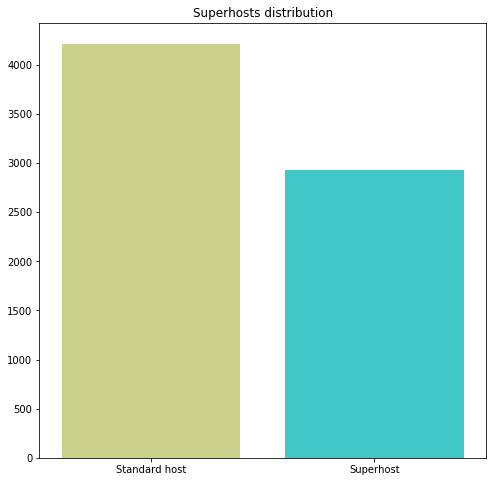

In [157]:
# Number of superhosts
plt.figure(figsize=(8,8))
sns.barplot(x=['Standard host', 'Superhost'], y = df['Superhost'].value_counts().values, palette='rainbow_r')
plt.title('Superhosts distribution')

The number of standard hosts is greater than the number of superhosts, but this difference is not sufficient to consider this data unballanced. Now let's study the variable <i> price </i>.

In [158]:
print('Variable Price:', '\n',
     'Mean: ', df['Price'].mean(), '\n',
     'Standard deviation: ', df['Price'].std(), '\n',
     'Skew: ', df['Price'].skew(),'\n',
     'Kurtosis: ', df['Price'].kurtosis())

Variable Price: 
 Mean:  213.30982367758187 
 Standard deviation:  311.37549915914906 
 Skew:  16.323316839813362 
 Kurtosis:  407.5615479294706


The average price is $\approx \$213$ and the standard deviation is $ \approx \$311$. The skew is $\approx 16$ and the kurtosis is $\approx 407$. For reference, a skew higher than $+1$ indicates that the distribution is highly shifted to the left of distributions' center, and a Kurtosis greater than $+3$ (the kurtosis of a standard normal distribution) means that the central peak of the distribution is much higher than the rest of the distribution. Let's visualize it in a graphic:

Text(0.5, 1.0, 'Prices distribution')

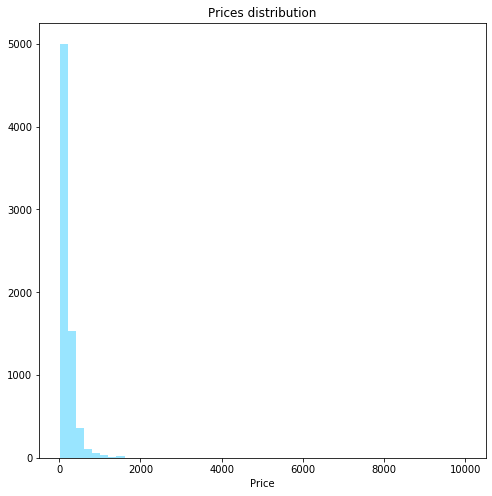

In [159]:
plt.figure(figsize=(8,8))
ax = sns.distplot(df['Price'], color = 'deepskyblue', kde = False)
plt.title('Prices distribution')

Zooming in the region of more relevant price values:

Text(0.5, 1.0, 'Prices distribution')

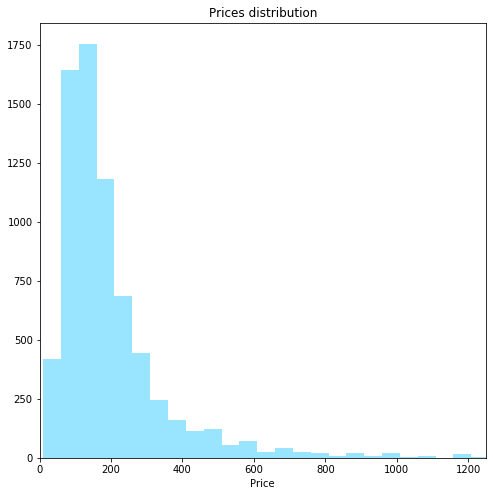

In [160]:
plt.figure(figsize=(8,8))
ax = sns.distplot(df['Price'], bins=200, color='deepskyblue', kde=False)
ax.set_xlim(0,1250)
plt.title('Prices distribution')

As I will do the same for the remaining variables, I will define a function to execute these steps.

In [161]:
def var_description(dataframe, column_name, color='deepskyblue'):
# This function calculates the main statistical measures of a given variable and plots 
# its distribution 
# Inputs: dataframe - DataFrame containing the variable
#         column_name - column_name that identifies the variable
#         color - Color of the plotting   
    print('Variable ', column_name, ': ', '\n',
     'Mean: ', dataframe[column_name].mean(), '\n',
     'Standard deviation: ', dataframe[column_name].std(), '\n',
     'Skew: ', dataframe[column_name].skew(),'\n',
     'Kurtosis: ', dataframe[column_name].kurtosis(), '\n')
    
    plt.figure(figsize=(8,8))
    
    ax = sns.distplot(dataframe[column_name], color = color, kde=False)
    plt.title(column_name + ' distribution')
    plt.show()

Before applying this function to the variables, let's select only the variables that makes sense and are interesting to apply such function. I will apply this function even for some discrete variables, as the ones related to <i>scores</i>.

In [162]:
df.columns

Index(['Superhost', 'Instant bookable', 'Bedrooms na', 'Bathrooms na',
       'Beds na', 'Review scores rating na', 'Review scores accuracy na',
       'Review scores cleanliness na', 'Review scores checkin na',
       'Review scores communication na', 'Review scores location na',
       'Review scores value na', 'Cancellation policy',
       'Host total listings count', 'Neighbourhood cleansed', 'Latitude',
       'Longitude', 'Property type', 'Room type', 'Accommodates', 'Bathrooms',
       'Bedrooms', 'Beds', 'Bed type', 'Minimum nights', 'Number of reviews',
       'Review scores rating', 'Review scores accuracy',
       'Review scores cleanliness', 'Review scores checkin',
       'Review scores communication', 'Review scores location',
       'Review scores value', 'Price', 'Description', 'Max guests'],
      dtype='object')

In [163]:
# Selecting columns ending with na
na_columns = ['Bedrooms na', 'Bathrooms na',
       'Beds na', 'Review scores rating na', 'Review scores accuracy na',
       'Review scores cleanliness na', 'Review scores checkin na',
       'Review scores communication na', 'Review scores location na',
       'Review scores value na']
# Selecting columns related to scores
scores_columns = ['Number of reviews',
       'Review scores rating', 'Review scores accuracy',
       'Review scores cleanliness', 'Review scores checkin',
       'Review scores communication', 'Review scores location',
       'Review scores value']
# Selecting geographical coordinates
coordinates = ['Latitude', 'Longitude']
# Selecting columns containing strings (For some of them, I will use one-hot encoding)
str_columns = df.dtypes.loc[df.dtypes == 'string'].index.to_list() + df.dtypes[df.dtypes == 'object'].index.to_list()
# Selecting binary columns (without na)
binary_columns = ['Superhost', 'Instant bookable']

Now, I apply the defined function ```var_description``` for every variable not present in the above listed columns.

In [164]:
variables_to_plot = df.drop(columns = na_columns +  coordinates+ str_columns + binary_columns)

In [165]:
len(variables_to_plot.columns)

15

There are 15 columns to be plotted. I will choose 7 different colors for the plottings.

In [166]:
colors = ['skyblue', 'steelblue', 'cadetblue', 'darkturquoise', 'cyan', 'lightseagreen', 'dodgerblue']

Variable  Host total listings count :  
 Mean:  52.60495382031906 
 Standard deviation:  177.42865262357344 
 Skew:  4.366470580164086 
 Kurtosis:  18.872985521915595 



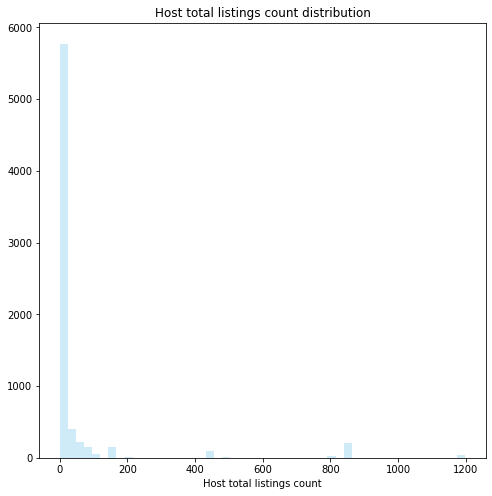

Variable  Accommodates :  
 Mean:  3.2010915197313183 
 Standard deviation:  1.914916274085987 
 Skew:  1.7024418594999178 
 Kurtosis:  4.403458047821758 



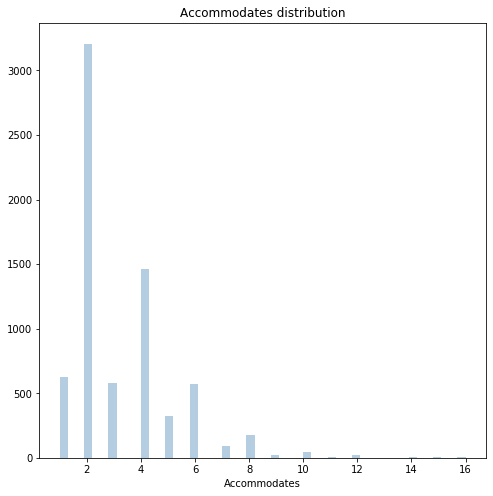

Variable  Bathrooms :  
 Mean:  1.3280856423173804 
 Standard deviation:  0.7937873897311364 
 Skew:  5.213487534417517 
 Kurtosis:  45.21238194432277 



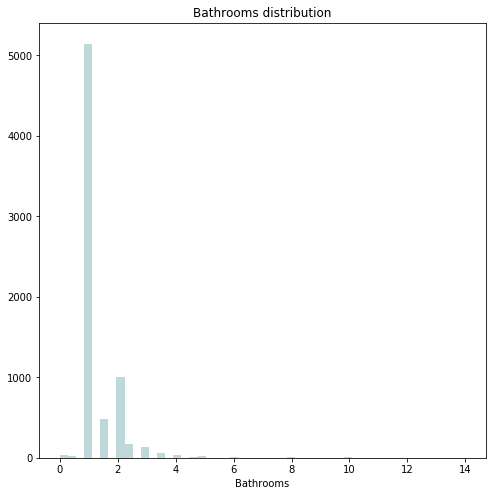

Variable  Bedrooms :  
 Mean:  1.3427092079485026 
 Standard deviation:  0.9328545736962851 
 Skew:  1.5374029623803063 
 Kurtosis:  6.763820666787206 



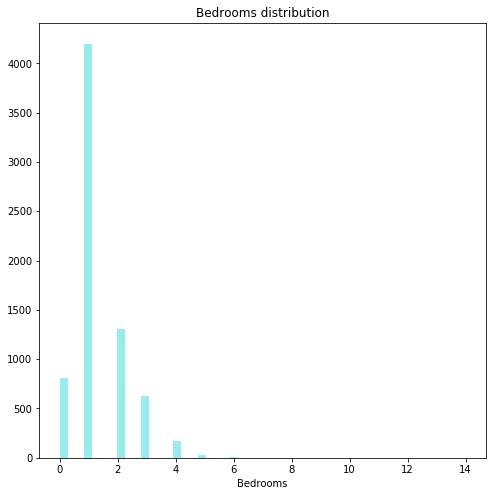

Variable  Beds :  
 Mean:  1.7644836272040303 
 Standard deviation:  1.1767889286473336 
 Skew:  2.181960724467116 
 Kurtosis:  7.942940416358486 



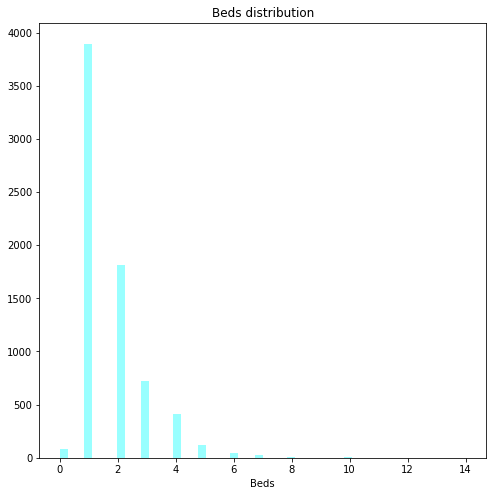

Variable  Minimum nights :  
 Mean:  15.817800167926112 
 Standard deviation:  22.511624478113298 
 Skew:  6.464085308066476 
 Kurtosis:  78.3205667790856 



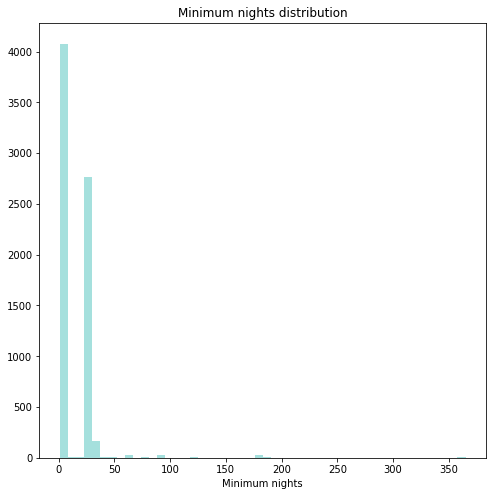

Variable  Number of reviews :  
 Mean:  43.55387629443045 
 Standard deviation:  72.53848066174558 
 Skew:  2.8326394097803944 
 Kurtosis:  10.420218357271366 



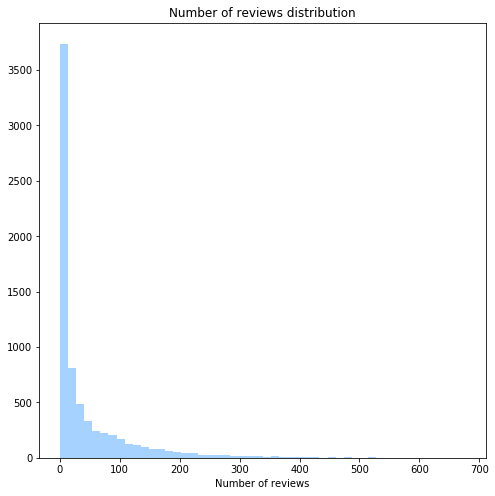

Variable  Review scores rating :  
 Mean:  96.03428491463755 
 Standard deviation:  6.286139464140212 
 Skew:  -4.943634686288115 
 Kurtosis:  38.67825631998998 



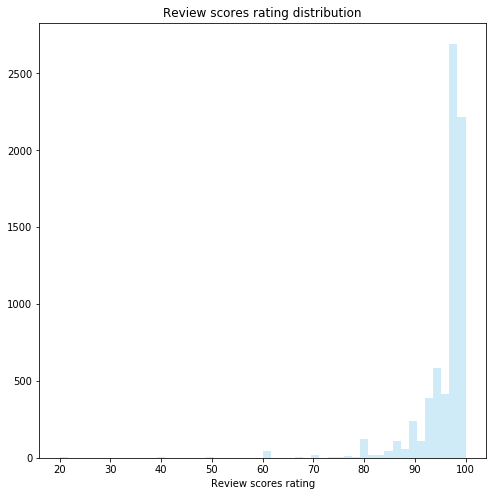

Variable  Review scores accuracy :  
 Mean:  9.82031905961377 
 Standard deviation:  0.6019898974278844 
 Skew:  -6.085393544119116 
 Kurtosis:  54.16845721091 



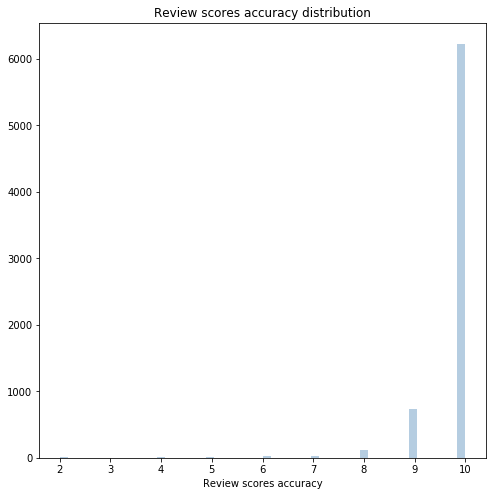

Variable  Review scores cleanliness :  
 Mean:  9.699552197033306 
 Standard deviation:  0.7038769541292945 
 Skew:  -3.7689897330349047 
 Kurtosis:  22.246043331549338 



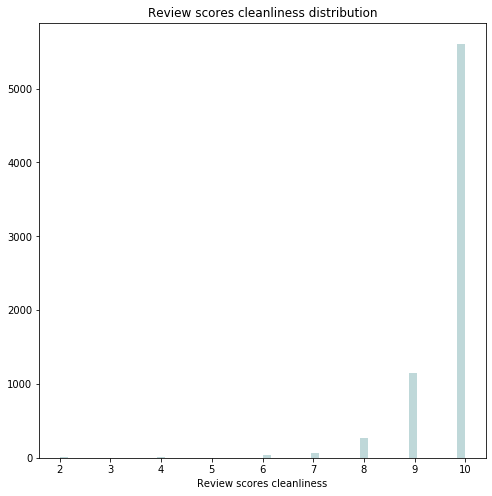

Variable  Review scores checkin :  
 Mean:  9.895885810243493 
 Standard deviation:  0.44870376137859064 
 Skew:  -7.696636590864137 
 Kurtosis:  92.46047843879212 



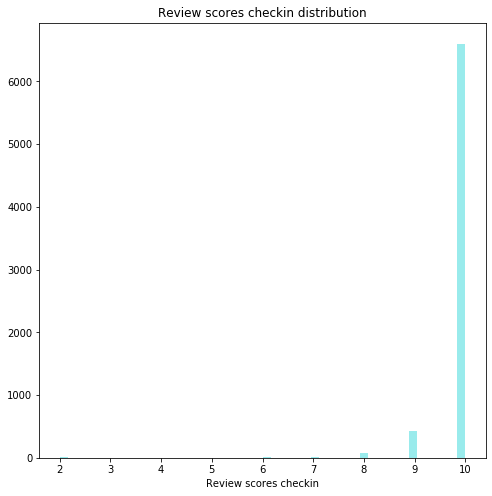

Variable  Review scores communication :  
 Mean:  9.8727959697733 
 Standard deviation:  0.5225993514047879 
 Skew:  -7.585702772986351 
 Kurtosis:  83.45392814498936 



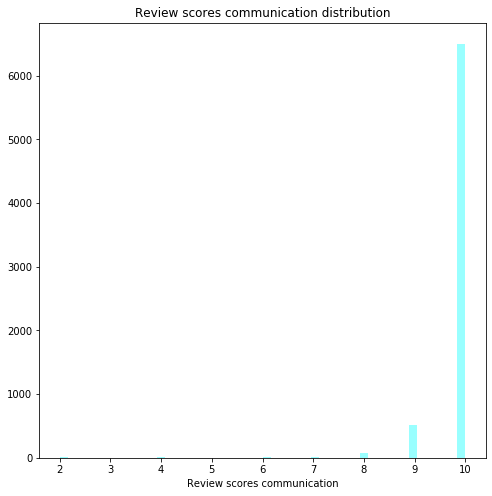

Variable  Review scores location :  
 Mean:  9.719143576826196 
 Standard deviation:  0.6592530453803926 
 Skew:  -4.295004093220345 
 Kurtosis:  30.704464963855138 



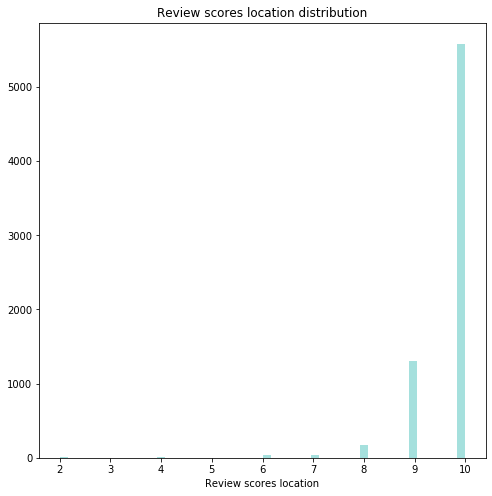

Variable  Review scores value :  
 Mean:  9.524349286314022 
 Standard deviation:  0.7516032059348855 
 Skew:  -2.9762549560877765 
 Kurtosis:  17.566905292159984 



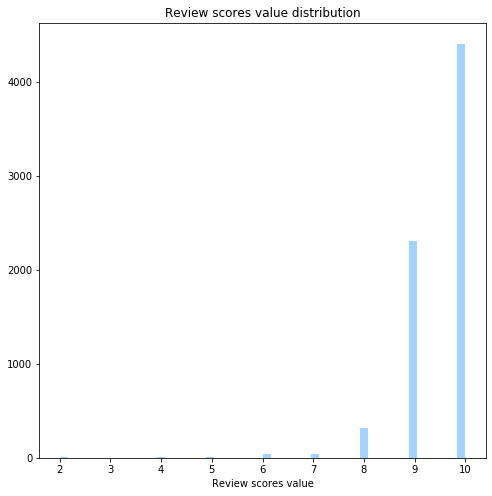

Variable  Price :  
 Mean:  213.30982367758187 
 Standard deviation:  311.37549915914906 
 Skew:  16.323316839813362 
 Kurtosis:  407.5615479294706 



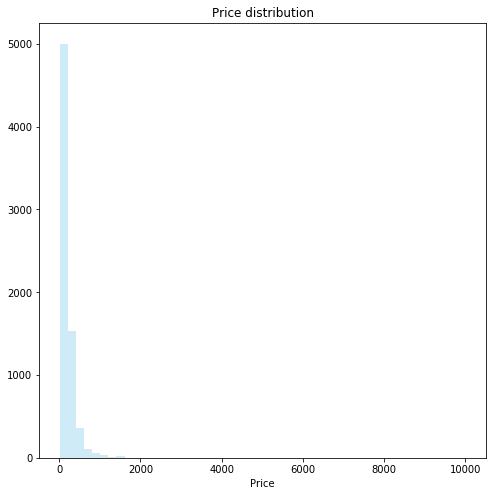

In [167]:
for column, color in zip(variables_to_plot.columns, colors + colors + [colors[0]]):
    var_description(variables_to_plot, column, color)

Let's visualize the distribution of prices by maximum number of guests and superhost status.

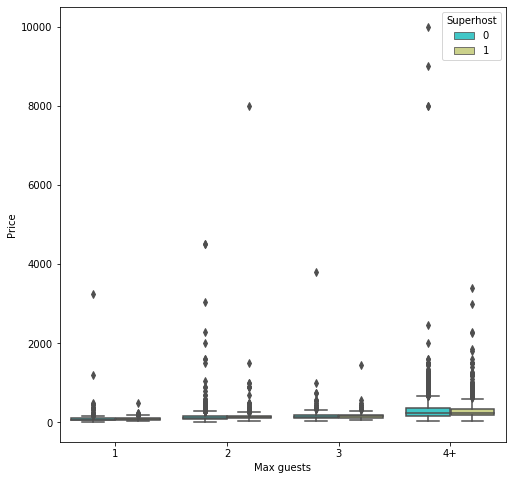

In [168]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df,
            y ='Price',
            x= 'Max guests',
            orient = 'v',
            hue = 'Superhost',
            palette = 'rainbow',
            order=['1', '2', '3', '4+'])

The boxplots are extremely squeezed and considering many data points as outliers. This indicates that this graph is not very adequate to deal with this type of data. Still, let's re-scale it just to have an idea of the behaviour of this variables.

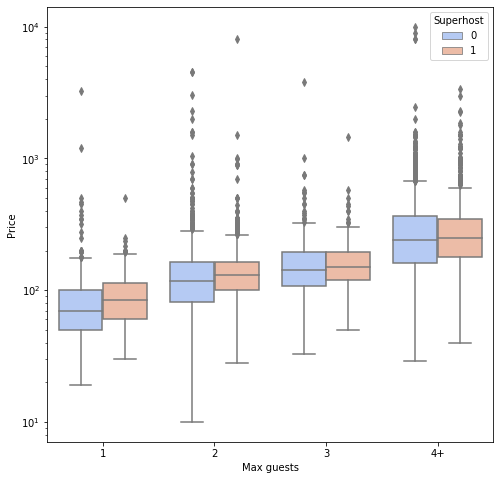

In [169]:
plt.figure(figsize=(8,8))
sns.boxplot(data=df,
            y ='Price',
            x= 'Max guests',
            orient = 'v',
            hue = 'Superhost',
            palette = 'coolwarm',
            order=['1', '2', '3', '4+'])
plt.yscale('log')

The above graphic indicates that superhosts tend to charge greater prices to their accommodations than standard hosts for accomodations with the same number of maximum guests. 

Before studying the correlations in the data, I will apply the <i>log</i> function to the variables plotted with the function ```var_description```, as the distributions are very skewed and squeezed. As some variables contain zeros, I will add a constant to them.

In [170]:
transf_columns = variables_to_plot.columns
df[transf_columns]

,Host total listings count,Accommodates,Bathrooms,Bedrooms,Beds,Minimum nights,Number of reviews,Review scores rating,Review scores accuracy,Review scores cleanliness,Review scores checkin,Review scores communication,Review scores location,Review scores value,Price
0,1,3,1.0,1,2,1,180,97,10,10,10,10,10,10,170.0
1,2,5,1.0,2,3,30,111,98,10,10,10,10,10,9,235.0
2,10,2,4.0,1,1,32,17,85,8,8,9,9,9,8,65.0
3,10,2,4.0,1,1,32,8,93,9,9,10,10,9,9,65.0
4,2,5,1.5,2,2,7,27,97,10,10,10,10,10,9,785.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7141,18,3,1.0,1,2,30,0,98,10,10,10,10,10,10,163.0
7142,10,2,1.0,0,1,1,0,98,10,10,10,10,10,10,160.0
7143,10,4,1.0,1,1,2,0,98,10,10,10,10,10,10,249.0
7144,87,3,1.0,1,2,30,0,98,10,10,10,10,10,10,105.0


In [171]:
transf_columns

Index(['Host total listings count', 'Accommodates', 'Bathrooms', 'Bedrooms',
       'Beds', 'Minimum nights', 'Number of reviews', 'Review scores rating',
       'Review scores accuracy', 'Review scores cleanliness',
       'Review scores checkin', 'Review scores communication',
       'Review scores location', 'Review scores value', 'Price'],
      dtype='object')

In [172]:
for column in transf_columns:
    df[column] = df[column].apply(lambda x: np.log(x + 1))
df[transf_columns]

,Host total listings count,Accommodates,Bathrooms,Bedrooms,Beds,Minimum nights,Number of reviews,Review scores rating,Review scores accuracy,Review scores cleanliness,Review scores checkin,Review scores communication,Review scores location,Review scores value,Price
0,0.693147,1.386294,0.693147,0.693147,1.098612,0.693147,5.198497,4.584967,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,5.141664
1,1.098612,1.791759,0.693147,1.098612,1.386294,3.433987,4.718499,4.595120,2.397895,2.397895,2.397895,2.397895,2.397895,2.302585,5.463832
2,2.397895,1.098612,1.609438,0.693147,0.693147,3.496508,2.890372,4.454347,2.197225,2.197225,2.302585,2.302585,2.302585,2.197225,4.189655
3,2.397895,1.098612,1.609438,0.693147,0.693147,3.496508,2.197225,4.543295,2.302585,2.302585,2.397895,2.397895,2.302585,2.302585,4.189655
4,1.098612,1.791759,0.916291,1.098612,1.098612,2.079442,3.332205,4.584967,2.397895,2.397895,2.397895,2.397895,2.397895,2.302585,6.666957
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7141,2.944439,1.386294,0.693147,0.693147,1.098612,3.433987,0.000000,4.595120,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,5.099866
7142,2.397895,1.098612,0.693147,0.000000,0.693147,0.693147,0.000000,4.595120,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,5.081404
7143,2.397895,1.609438,0.693147,0.693147,0.693147,1.098612,0.000000,4.595120,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,5.521461
7144,4.477337,1.386294,0.693147,0.693147,1.098612,3.433987,0.000000,4.595120,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,4.663439


Let's evaluate the function ```var_description``` once again in this transformed data.

Variable  Host total listings count :  
 Mean:  1.85775434146677 
 Standard deviation:  1.616335190124714 
 Skew:  1.6540120002894796 
 Kurtosis:  1.8576214812337368 



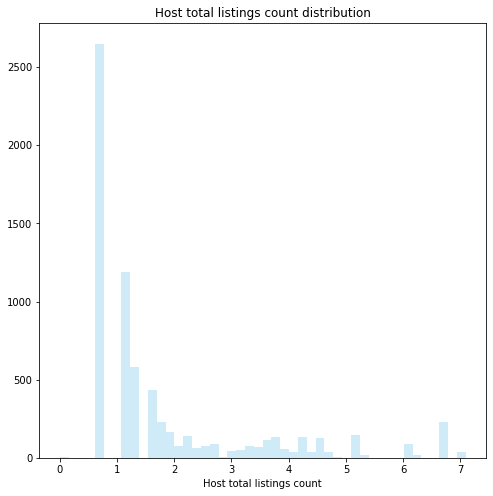

Variable  Accommodates :  
 Mean:  1.3496094474026559 
 Standard deviation:  0.40090000442453805 
 Skew:  0.5309317948207185 
 Kurtosis:  -0.17561931569501965 



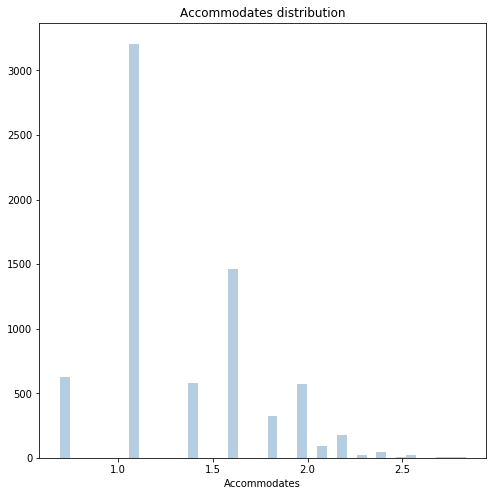

Variable  Bathrooms :  
 Mean:  0.8099234886951235 
 Standard deviation:  0.24101424578364308 
 Skew:  2.047039895721473 
 Kurtosis:  7.687299157516861 



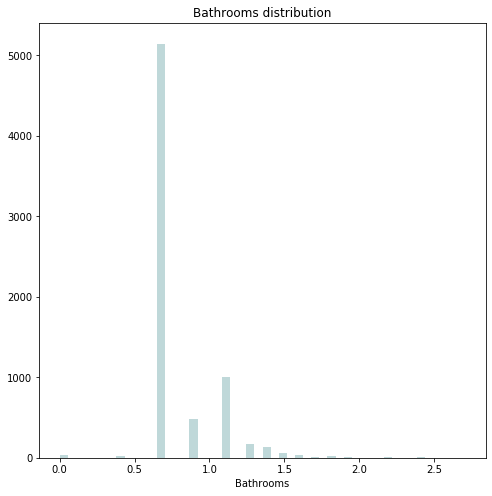

Variable  Bedrooms :  
 Mean:  0.7784981452630179 
 Standard deviation:  0.38316227998462227 
 Skew:  -0.11467388862715966 
 Kurtosis:  0.5138341037993084 



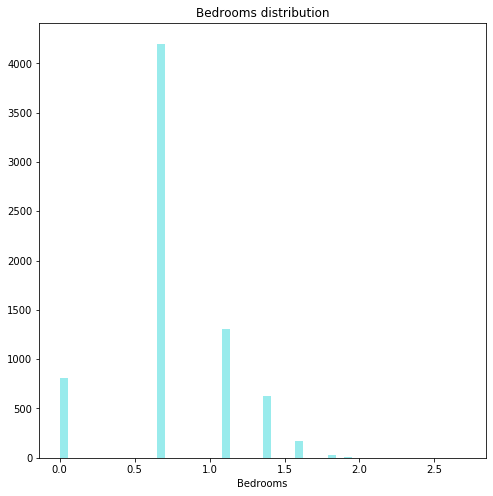

Variable  Beds :  
 Mean:  0.9473910517891051 
 Standard deviation:  0.3547326896526151 
 Skew:  0.827361014558584 
 Kurtosis:  0.7597380084448595 



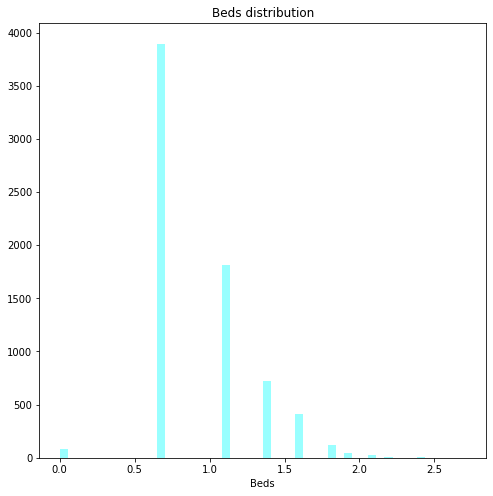

Variable  Minimum nights :  
 Mean:  2.134438158587534 
 Standard deviation:  1.2134783975245966 
 Skew:  0.23722453457801582 
 Kurtosis:  -1.5496278451761778 



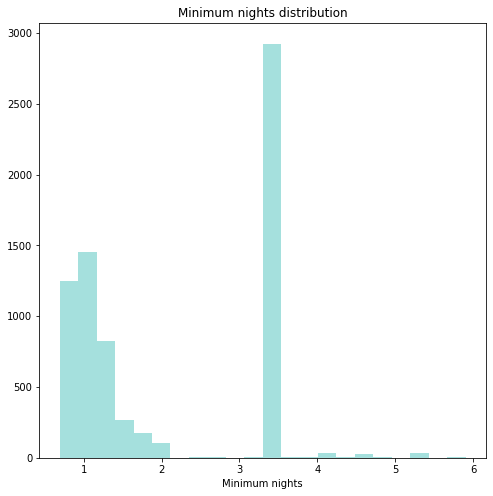

Variable  Number of reviews :  
 Mean:  2.4774070731183535 
 Standard deviation:  1.7949724037769008 
 Skew:  0.059456607979840766 
 Kurtosis:  -1.2276545153779117 



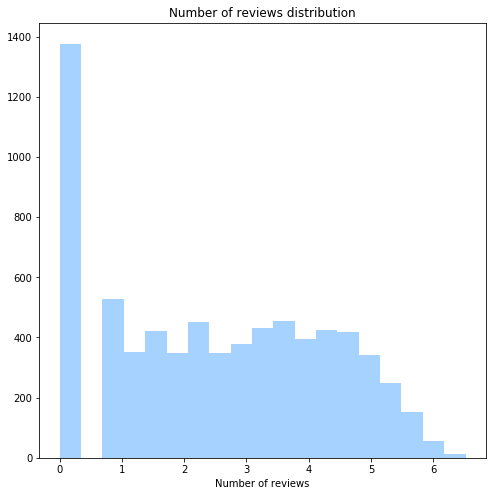

Variable  Review scores rating :  
 Mean:  4.572078192076473 
 Standard deviation:  0.08622580393239644 
 Skew:  -8.978703615640526 
 Kurtosis:  127.48889300414541 



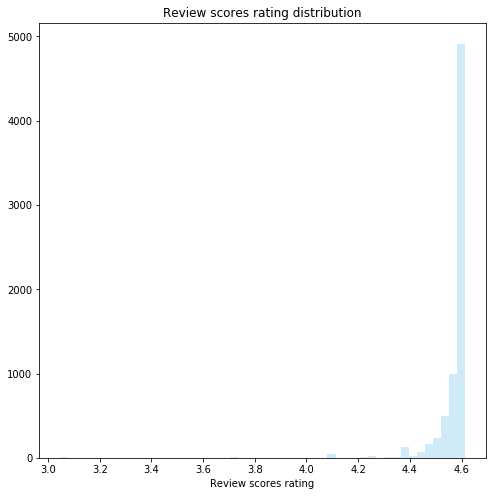

Variable  Review scores accuracy :  
 Mean:  2.3792370329714188 
 Standard deviation:  0.07323784520143839 
 Skew:  -9.472196773391957 
 Kurtosis:  130.7850139979859 



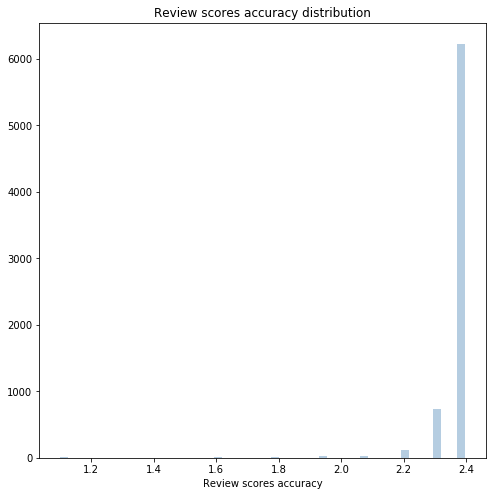

Variable  Review scores cleanliness :  
 Mean:  2.3674515121581643 
 Standard deviation:  0.07962146474157103 
 Skew:  -6.036868307087312 
 Kurtosis:  64.30549641770298 



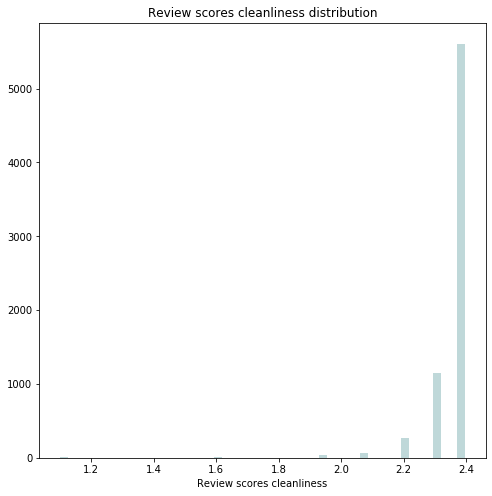

Variable  Review scores checkin :  
 Mean:  2.3872056927005754 
 Standard deviation:  0.05364752130980292 
 Skew:  -12.831924599171225 
 Kurtosis:  256.3034234274015 



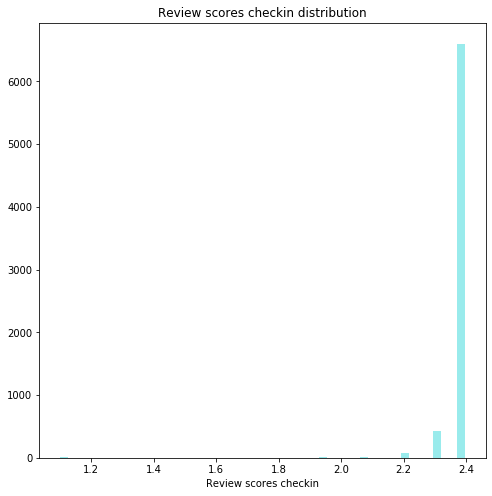

Variable  Review scores communication :  
 Mean:  2.384571483628384 
 Standard deviation:  0.06507685354650183 
 Skew:  -11.812692257662134 
 Kurtosis:  195.72880457015265 



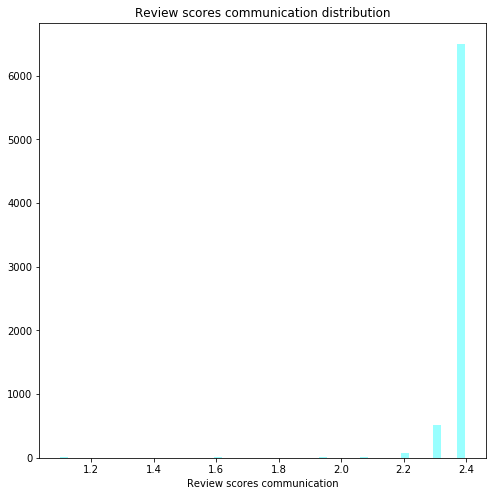

Variable  Review scores location :  
 Mean:  2.369561819232818 
 Standard deviation:  0.07613824312712406 
 Skew:  -7.1989824348320015 
 Kurtosis:  87.96397729256866 



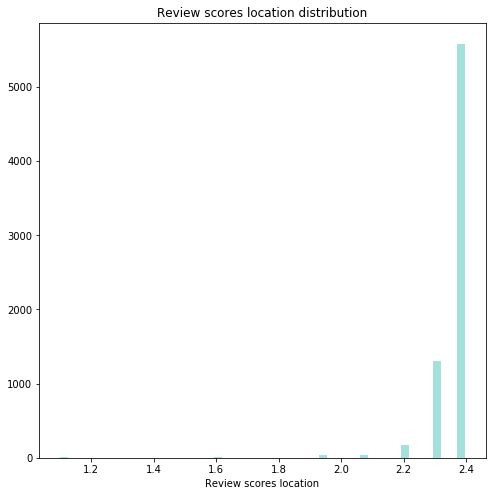

Variable  Review scores value :  
 Mean:  2.3505074531590955 
 Standard deviation:  0.08551079260384235 
 Skew:  -5.592002259326548 
 Kurtosis:  61.1442012246518 



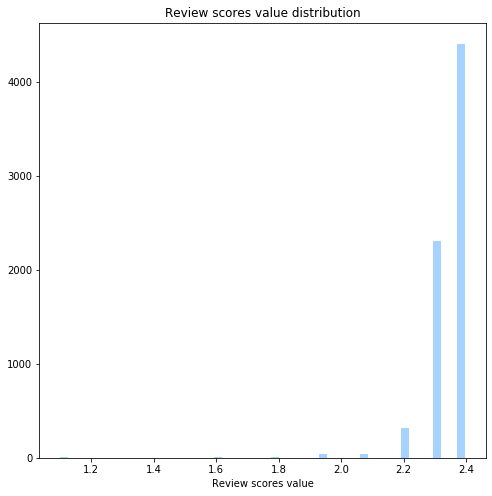

Variable  Price :  
 Mean:  5.080167538133824 
 Standard deviation:  0.6832347324358559 
 Skew:  0.6014484910999184 
 Kurtosis:  1.5064957999543114 



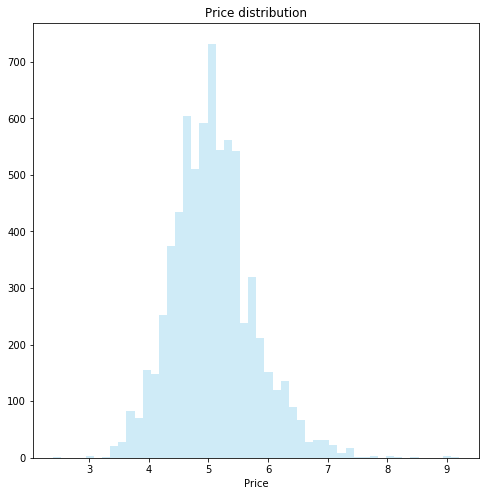

In [173]:
for column, color in zip(transf_columns, colors + colors + [colors[0]]):
    var_description(df, column, color)

Now, let's investigate the correlation between the all the variables and look with more details to the combinations of variables with greater correlations. 

In [174]:
df.describe()

,Superhost,Instant bookable,Bedrooms na,Bathrooms na,Beds na,Review scores rating na,Review scores accuracy na,Review scores cleanliness na,Review scores checkin na,Review scores communication na,...,Minimum nights,Number of reviews,Review scores rating,Review scores accuracy,Review scores cleanliness,Review scores checkin,Review scores communication,Review scores location,Review scores value,Price
count,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,...,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000,7146.000000
mean,0.410160,0.380073,0.000280,0.002939,0.000980,0.198853,0.199412,0.199272,0.199692,0.199132,...,2.134438,2.477407,4.572078,2.379237,2.367452,2.387206,2.384571,2.369562,2.350507,5.080168
std,0.491897,0.485438,0.016728,0.054134,0.031285,0.399165,0.399586,0.399481,0.399797,0.399376,...,1.213478,1.794972,0.086226,0.073238,0.079621,0.053648,0.065077,0.076138,0.085511,0.683235
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.693147,0.000000,3.044522,1.098612,1.098612,1.098612,1.098612,1.098612,1.098612,2.397895
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.098612,0.693147,4.564348,2.397895,2.397895,2.397895,2.397895,2.397895,2.302585,4.615121
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.609438,2.484907,4.595120,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,5.017280
75%,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,3.433987,4.007333,4.605170,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,5.463832
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,5.902633,6.519147,4.615121,2.397895,2.397895,2.397895,2.397895,2.397895,2.397895,9.210440


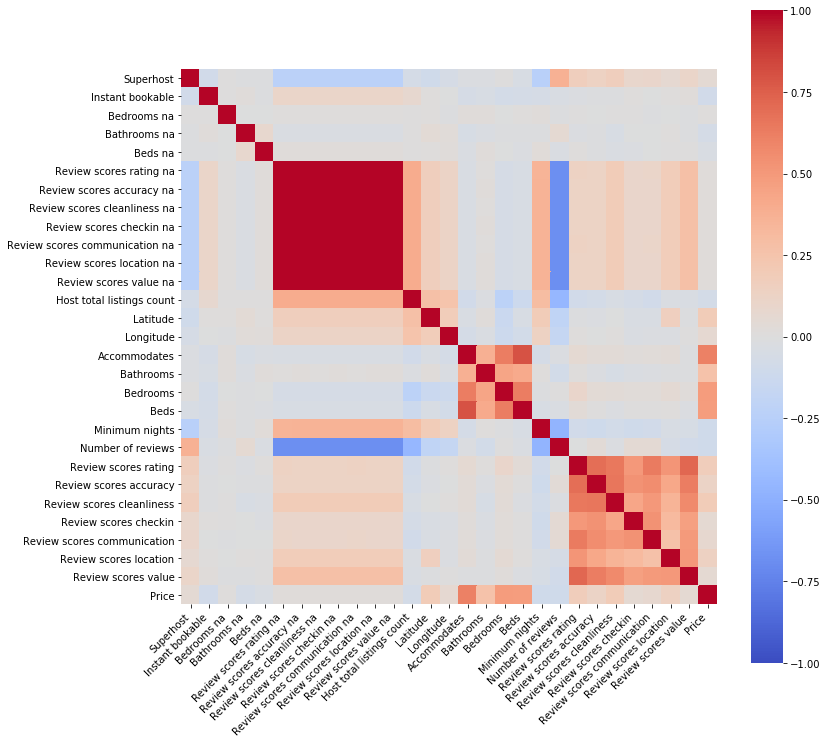

In [175]:
plt.figure(figsize = (12,12))
ax = sns.heatmap(
    df.corr(), 
    vmin=-1, vmax=1, center=0,
    cmap='coolwarm',
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

From the above correlation heatmap, we can conclude the following about the variables:
* Variables ending with ```na``` form a correlation cluster, each one highly (or perfectly) correlating with each other. This is an evidence that for each element with an empty entry, the other entries are empty as well;
* Variables associated with scores also form a correlation cluster, which is perfectly reasonable, as the ratings tend to follow the same pattern;
* The variable ```number of reviews``` is slightly anticorrelated with the columns ending with ```na```, which is very expected, as the number of reviews decreases in the data when the number of missing values increases;
* The variable ```minimum nights``` is slightly anticorrelated with ```superhost```, which suggests that superhosts tend to smaller number of minimum nights than standard hosts;
* The variables related to the accommodation characteristics (```Accommodates```, ```Bedrooms```, ```Bathrooms```,```Beds```) also form a correlation cluster and these variables are also considerably correlated with ```Price```.
* The variable ```Price``` is slightly correlated with the location given by the latitude and longitude, which means that the specific location of the accommodation may have a slight effect on the final price of the accommodation;

## Modeling

In this section, I develop the modeling of the data to acchieve one simple objective: Accommodation precification.
For that, I will apply a regression model to describe the prices as function of other variables; 

Before fiting a regression model, I first need to transform data stored as strings (columns ```Cancellation policy```, ```Neighbourhood cleansed```, ```Property type```, ```Room type```, ```Bed type```) as numerical variables using one-hot encoding:

In [176]:
str_cols # Columns of the type string 

['Cancellation policy',
 'Neighbourhood cleansed',
 'Property type',
 'Room type',
 'Bed type']

In [177]:
str_columns # Columns of the type string and object. The object columns were created by me from original data and
# can be dropped without loss of information

['Cancellation policy',
 'Neighbourhood cleansed',
 'Property type',
 'Room type',
 'Bed type',
 'Description',
 'Max guests']

In [178]:
numerical_df = pd.get_dummies(data=df,columns=str_cols, prefix_sep=' | ', drop_first=True).copy() # Copying the original 
# DataFrame to avoid removing important data from it
numerical_df.drop(columns = ['Description', 'Max guests'], inplace = True)

Let's verify the data types in the dataframe now

In [179]:
# Need to print to access all the values, avoiding "..."
for types in numerical_df.dtypes:
    print(types)

int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
int64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8
uint8


Now that every variable is numerical, I will re-scale the data to make them all be described by a single measure.
The scaling to be used here is the Standard scaler, which replaces the data points by
$$ z_i= \frac{x_i - \mu}{\sigma}, $$ where $\mu$ is the mean of the sample and $\sigma$ is the standard deviation. The new distribution has mean $=0$ and standard deviation $=1$.

In [180]:
# Separating target variable price (y) from input variables (x)
x = numerical_df[numerical_df.columns.difference(['Price'])]
y = numerical_df['Price']

In [181]:
# Importing necessary library for scaling
from sklearn.preprocessing import StandardScaler
# Iniciating scaler
scaling = StandardScaler()
scaled_data = scaling.fit_transform(x)

 To verify that the scaling is correct, let's inspect if the new variables have mean $=0$ and and std $=1$.

In [182]:
x = pd.DataFrame(data=scaled_data, columns= x.columns)
x.describe()

,Accommodates,Bathrooms,Bathrooms na,Bed type | Couch,Bed type | Futon,Bed type | Pull-out Sofa,Bed type | Real Bed,Bedrooms,Bedrooms na,Beds,...,Review scores communication na,Review scores location,Review scores location na,Review scores rating,Review scores rating na,Review scores value,Review scores value na,Room type | Private room,Room type | Shared room,Superhost
count,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,...,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03,7.146000e+03
mean,1.329005e-15,3.649629e-16,-4.250202e-15,6.443228e-16,-4.860465e-15,-2.084766e-15,-3.965012e-15,-3.187533e-15,-6.447520e-16,-1.363915e-15,...,-3.346541e-14,-2.386047e-15,-6.065366e-16,1.360000e-15,-2.914508e-14,-9.406414e-15,-2.496333e-14,2.393520e-16,2.373401e-16,9.710490e-16
std,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,...,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00,1.000070e+00
min,-1.637586e+00,-3.360715e+00,-5.428967e-02,-3.131341e-02,-6.706842e-02,-5.682408e-02,-9.843293e+00,-2.031914e+00,-1.673186e-02,-2.670905e+00,...,-4.986440e-01,-1.669382e+01,-4.995189e-01,-1.771700e+01,-4.982064e-01,-1.464123e+01,-4.997376e-01,-7.569474e-01,-1.602890e-01,-8.338907e-01
25%,-6.261280e-01,-4.845543e-01,-5.428967e-02,-3.131341e-02,-6.706842e-02,-5.682408e-02,1.015920e-01,-2.227697e-01,-1.673186e-02,-7.167698e-01,...,-4.986440e-01,3.721577e-01,-4.995189e-01,-8.965462e-02,-4.982064e-01,-5.604639e-01,-4.997376e-01,-7.569474e-01,-1.602890e-01,-8.338907e-01
50%,-6.261280e-01,-4.845543e-01,-5.428967e-02,-3.131341e-02,-6.706842e-02,-5.682408e-02,1.015920e-01,-2.227697e-01,-1.673186e-02,-7.167698e-01,...,-4.986440e-01,3.721577e-01,-4.995189e-01,2.672433e-01,-4.982064e-01,5.542123e-01,-4.997376e-01,-7.569474e-01,-1.602890e-01,-8.338907e-01
75%,6.481583e-01,4.413627e-01,-5.428967e-02,-3.131341e-02,-6.706842e-02,-5.682408e-02,1.015920e-01,8.355116e-01,-1.673186e-02,4.263261e-01,...,-4.986440e-01,3.721577e-01,-4.995189e-01,3.838098e-01,-4.982064e-01,5.542123e-01,-4.997376e-01,1.321096e+00,-1.602890e-01,1.199198e+00
max,3.700942e+00,7.876130e+00,1.841971e+01,3.193520e+01,1.491015e+01,1.759817e+01,1.015920e-01,5.036214e+00,5.976621e+01,4.963688e+00,...,2.005439e+00,3.721577e-01,2.001926e+00,4.992164e-01,2.007200e+00,5.542123e-01,2.001050e+00,1.321096e+00,6.238733e+00,1.199198e+00


Now, let's model the data with a simple regression model.

In [183]:
# Importing necessary library from linear regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
# Splitting data into train data and test data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.25, random_state = 1)

In [184]:
lm = LinearRegression()
lm.fit(x_train, y_train)
# Calculating the R^2 score
lm.score(x_train, y_train)

0.6531174587607768

The linear regression model did not perform very well. Let's plot some other graphics to see the behave of Price as function of other variables

In [185]:
lin_test_cols = ['Host total listings count', 'Latitude',
       'Longitude', 'Accommodates', 'Bathrooms', 'Bedrooms', 'Beds',
       'Minimum nights', 'Number of reviews', 'Review scores rating',
       'Review scores accuracy', 'Review scores cleanliness',
       'Review scores checkin', 'Review scores communication',
       'Review scores location', 'Review scores value']

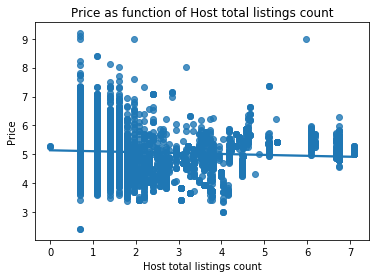

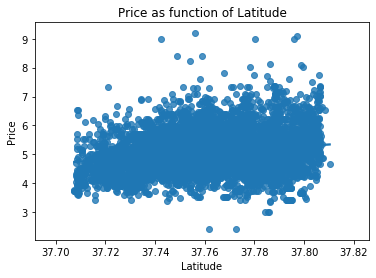

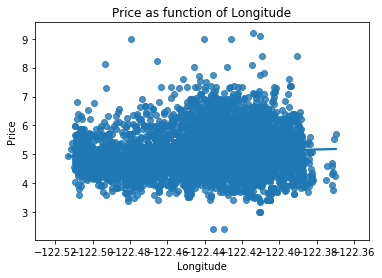

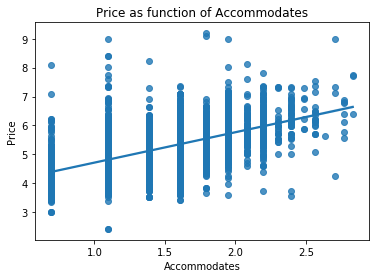

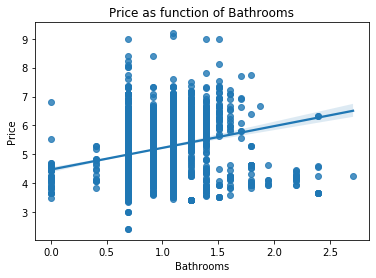

...

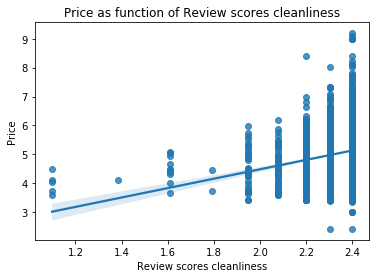

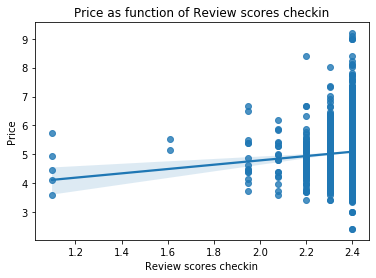

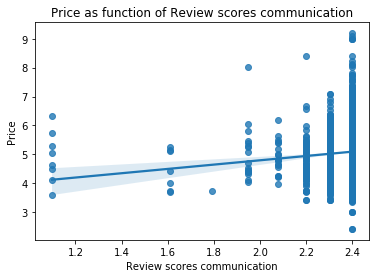

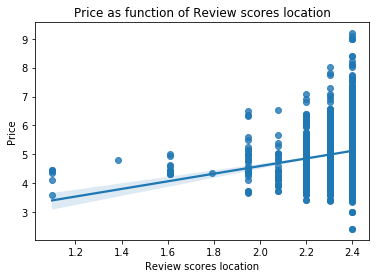

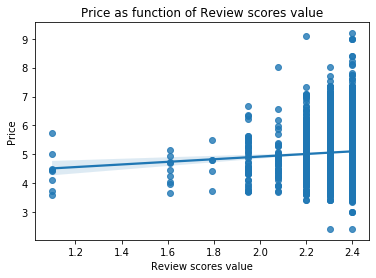

In [186]:
for column in lin_test_cols:
    sns.regplot(y='Price', x=column, data = df)
    plt.title('Price as function of ' + column)
    plt.show()

As we can see by the above graphics and the linear model performance, the simple linear regression is rather simple for describing the complexity of the data. The visualizations show that a polynomial regression probably will not help much either. 

Let's replace the model by the Lasso.

In [187]:
from sklearn.linear_model import Lasso

lasso = Lasso(alpha = 0.001)
lasso.fit(x_train, y_train)
lasso.score(x_train, y_train)

0.6520345148496762

A more complex model with a very similar accuracy compared to the linear model. Let's try one final model: Ridge regression.

In [188]:
from sklearn.linear_model import Ridge
ridge = Ridge(alpha = 1)
ridge.fit(x_train, y_train)
ridge.score(x_train, y_train)

0.6530996800784854

Let's try one final model: A polynomial regression of order 2. As the number of features increases exponentialy with the power of the regression, I will remove some variables that have weak correlation with the target feature price.

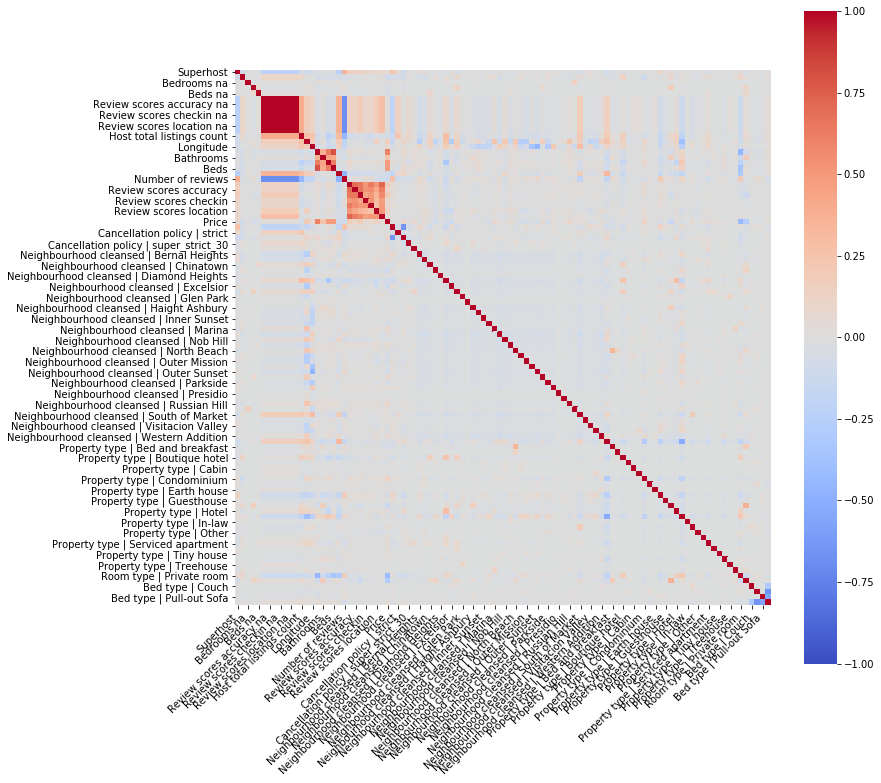

In [189]:
plt.figure(figsize = (12,12))
ax = sns.heatmap(
    numerical_df.corr(), 
    vmin=-1, vmax=1, center=0,
    cmap='coolwarm',
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

The same pattern of the heatmap previously plotted is repeated. The great majority of categorical variables modified by using the one-hot encoding are not relevant for the price. Let's keep only the interesting variables.

In [190]:
relevant_columns = ['Accommodates', 
                    'Bathrooms',
                    'Bed type | Couch',
                    'Bed type | Futon',
                    'Bed type | Pull-out Sofa',
                    'Bed type | Real Bed',
                    'Bedrooms',
                    'Beds',
                    'Latitude',
                    'Longitude',
                    'Minimum nights',
                    'Review scores accuracy',
                    'Review scores checkin',
                    'Review scores cleanliness',
                    'Review scores communication',
                    'Review scores location',
                    'Review scores rating',
                    'Review scores value',
                    'Room type | Private room',
                    'Room type | Shared room', 
                    'Superhost']

columns_to_drop = x.columns.difference(relevant_columns)
x.drop(columns = columns_to_drop, inplace = True)

Testing polynomial regression of order 4

In [191]:
# # CAUTION! THIS CELL DEMANDS A GREAT AMOUNT OF MEMORY (~8 GB), DO NOT RUN IT WITHOUT HAVING THE RESOURCES FOR IT

# from sklearn.preprocessing import PolynomialFeatures

# poly = PolynomialFeatures(4)
# x_poly = poly.fit_transform(X = x, y=y)

# x_train, x_test, y_train, y_test= train_test_split(x_poly, y, test_size=0.25, random_state = 1)

# lm = LinearRegression()
# lm.fit(x_train, y_train)
# lm.score(x_train, y_train)

r2 score of order 4 polynomial regression: 0.8922299203919501

A polynomial regression of order 4 increased considerably the performance of the model in comparison to linear regression. Now let's verify how the model performs over the test set

In [192]:
from sklearn.metrics import r2_score

yhat = lm.predict(x_test)
r2_score(y_test, yhat)

-1.8721122363620382e+21

The above scores shows that the model is overfitted, as the R^2 score is a very big negative number, which means that the model is overfitted in the training set. Let's try again with an order 3 polynomial.

In [193]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(3)
x_poly = poly.fit_transform(X = x, y=y)

x_train, x_test, y_train, y_test= train_test_split(x_poly, y, test_size=0.25, random_state = 1)

lm = LinearRegression()
lm.fit(x_train, y_train)
lm.score(x_train, y_train)

0.7686474718116213

In [194]:
from sklearn.metrics import r2_score

yhat = lm.predict(x_test)
r2_score(y_test, yhat)

-8.288150126413269e+18

The order 3 polynomial regression performance is also bad, with overfitted model.

In [195]:
from sklearn.preprocessing import PolynomialFeatures

poly = PolynomialFeatures(2)
x_poly = poly.fit_transform(X = x, y=y)

x_train, x_test, y_train, y_test= train_test_split(x_poly, y, test_size=0.25, random_state = 1)

lm = LinearRegression()
lm.fit(x_train, y_train)
lm.score(x_train, y_train)

0.6746354995001007

In [196]:
yhat = lm.predict(x_test)
r2_score(y_test, yhat)

-5.961189735739247e+21

The order 2 polynomial regression is still having a bad performance.

In [197]:
x_train, x_test, y_train, y_test= train_test_split(x, y, test_size=0.25, random_state = 1)

lm = LinearRegression()
lm.fit(x_train, y_train)
lm.score(x_train, y_train)

0.6099197485534316

In [198]:
yhat = lm.predict(x_test)
r2_score(y_test, yhat)

0.5894208915160779

The Lasso model and the Ridge regression did not perform better than the simple linear model to determine the accommodations' prices. However, the performances of the models measured by the R² score were not very satisfactory, under 70%. The possible solution is to try more complex models. 

We did it using polynomial regression, with polynomials of orders 3 and 4. In the order 4, the R² score increased considerably, having a value of almost 90%. However, when measuring the performance in the test set, we verify that the performance of the model to predict values of this set is extremely low, which means that the model is overfitted in the training set. The same happens for orders 3 and 2.

The conclusion is that the best model is the linear regression applied to all of the data, keeping features that are not much correlated with it. The best performance acchieved by the linear regression model is $R^2 \approx 65%$